In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from sklearn.preprocessing import scale
from pyclustertend import hopkins, vat, ivat
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm

/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/tqdm/autonotebook.py:17: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [4]:
from avgn.clusterability.hopkins import hopkins_statistic

In [6]:
from avgn.clusterability.VAT import ordered_dissimilarity_matrix, ivat_ordered_dissimilarity_matrix

In [7]:
datasets = list(DATA_DIR.glob('embeddings/*/*.pickle'))
len(datasets)

83

In [8]:
def remove_outliers(z, pct = 99.5):
    """ GPU based UMAP algorithm produces some outliers that UMAP does not, but is much faster
    this is a quick fix for that. 
    """
    _min = np.percentile(z, (100-pct), axis=0)
    _max = np.percentile(z, pct, axis=0)
    for col in range(np.shape(z)[1]):
        mask = z[:,col] < _min[col]
        z[mask,col] = _min[col]
        mask = z[:,col] > _max[col]
        z[mask,col] = _max[col]
    return z

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC592.pickle (4101, 2)


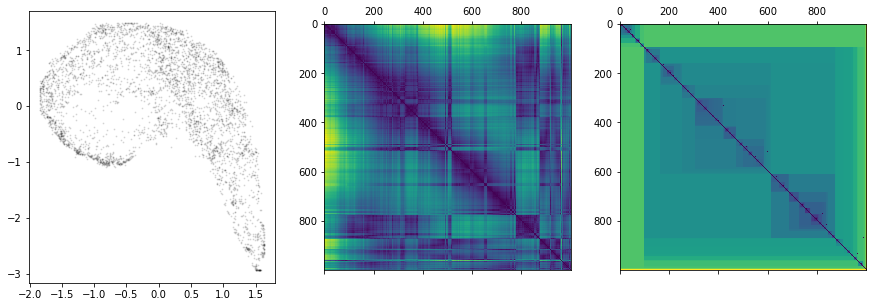

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC591.pickle (7856, 2)


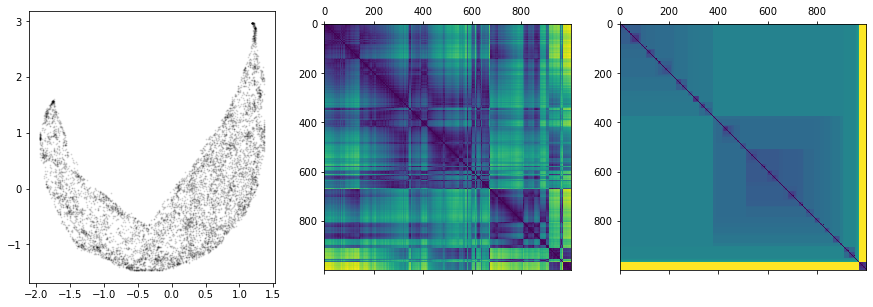

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC597.pickle (1575, 2)


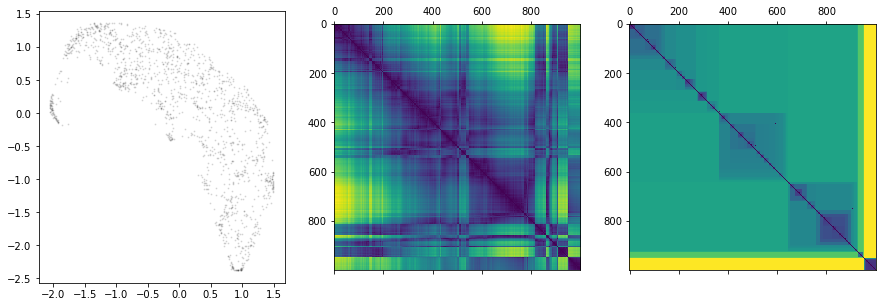

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC594.pickle (8302, 2)


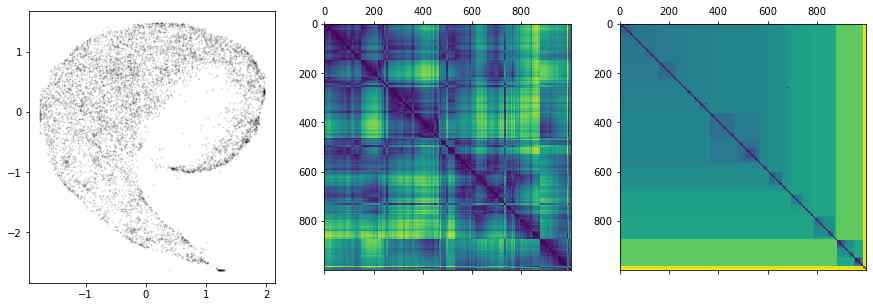

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/BIRD_DB_Vireo_cassinii/full.pickle (67032, 2)


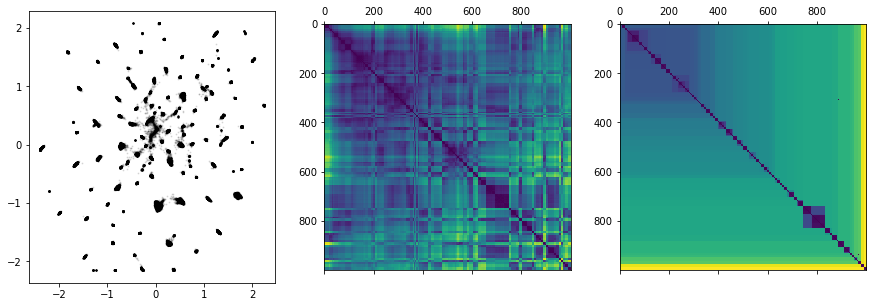

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/gibbon_morita_segmented/full.pickle (9220, 2)


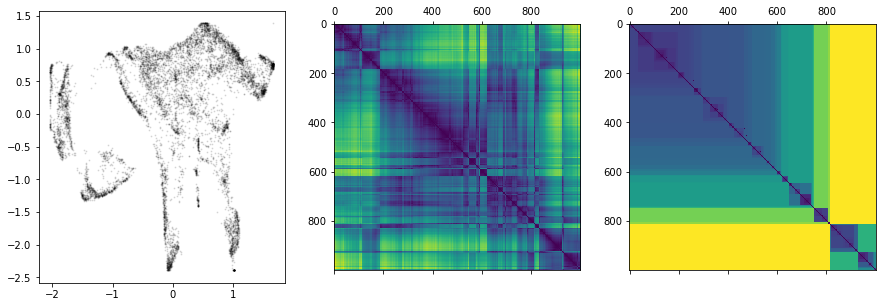

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/or60yw70.pickle (35799, 2)


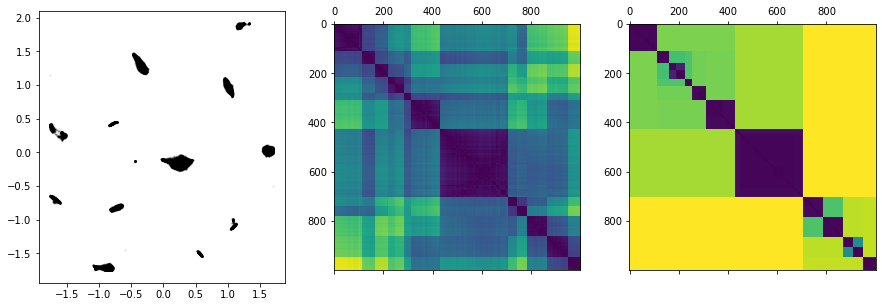

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/gr41rd51.pickle (52788, 2)


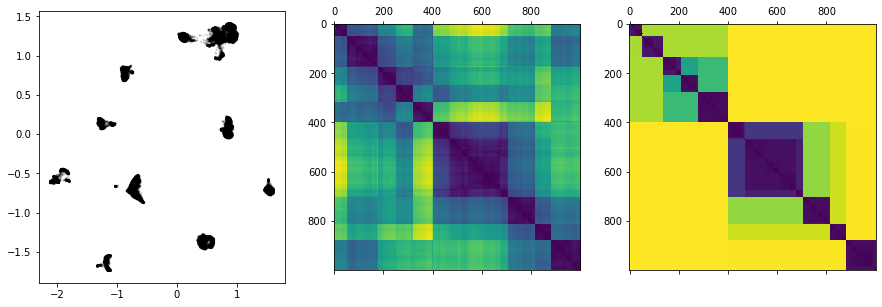

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/bl26lb16.pickle (70701, 2)


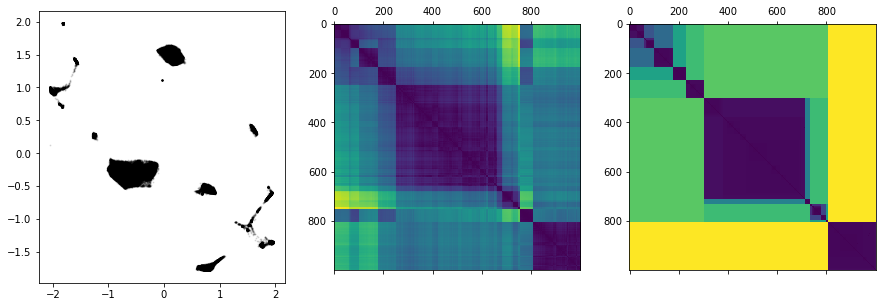

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/gy6or6.pickle (56375, 2)


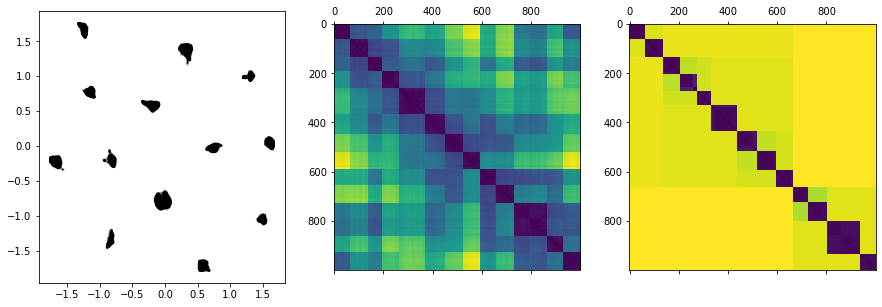

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/BIRD_DB_Toxostoma_redivivum/full.pickle (15546, 2)


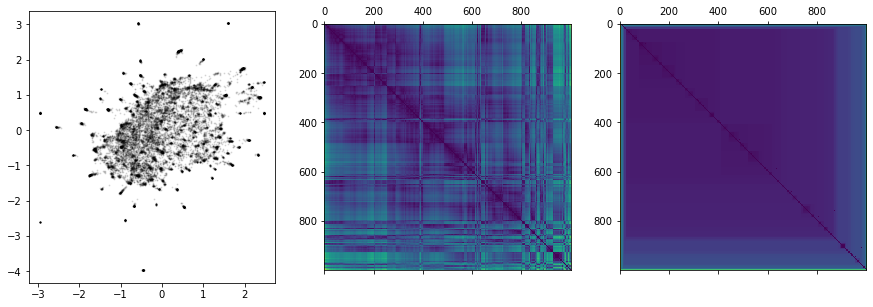

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/buckeye/human_full.pickle (837207, 2)


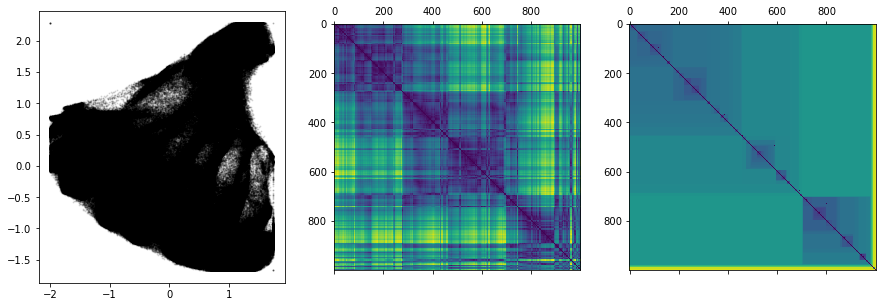

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/swamp_sparrow/full.pickle (97573, 2)


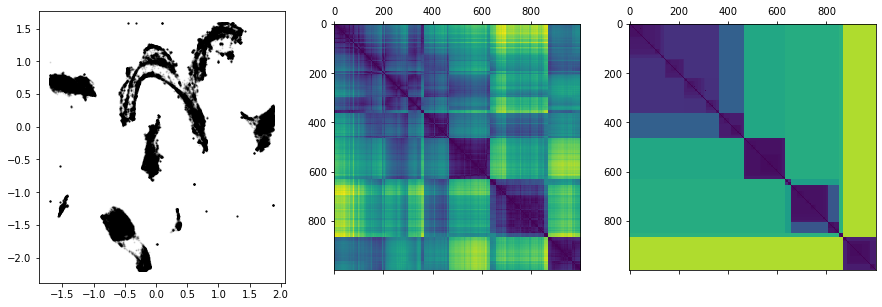

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/mobysound_humpback_whale/full.pickle (2310, 2)


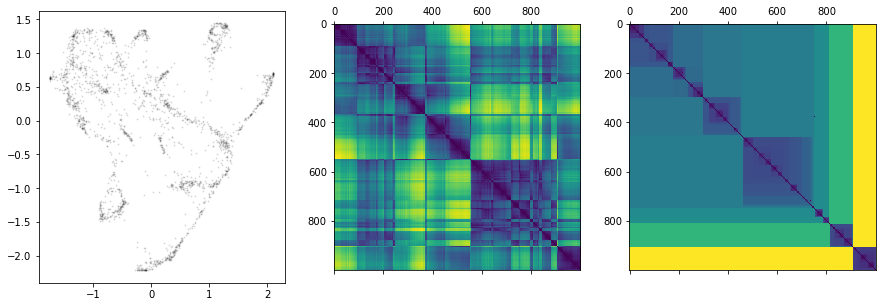

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird4.pickle (26891, 2)


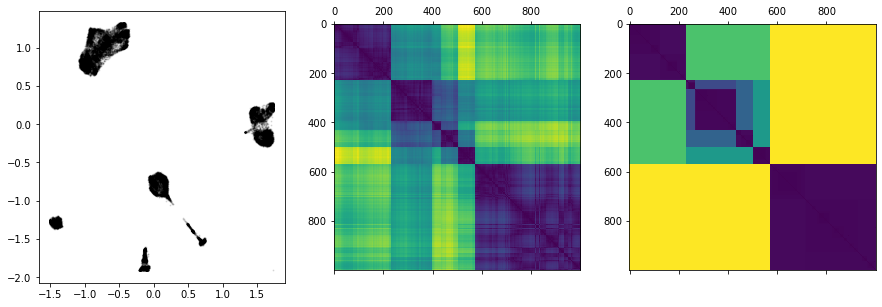

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird3.pickle (29470, 2)


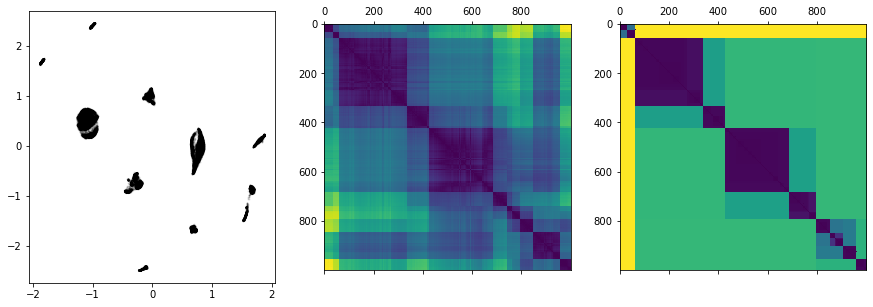

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird1.pickle (35606, 2)


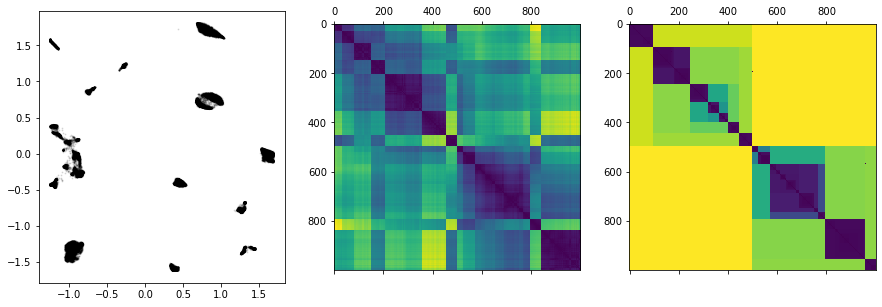

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird10.pickle (5743, 2)


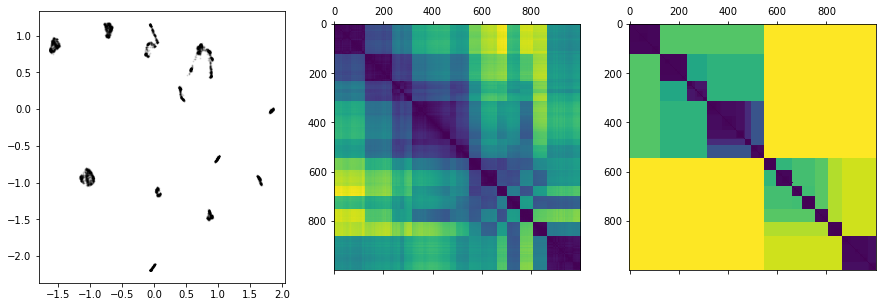

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird9.pickle (19541, 2)


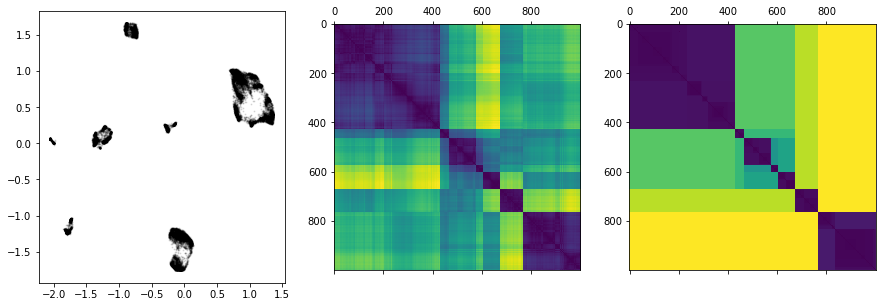

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird6.pickle (17653, 2)


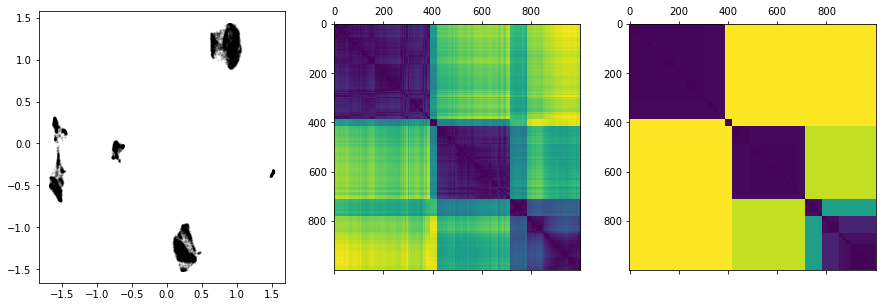

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird5.pickle (20525, 2)


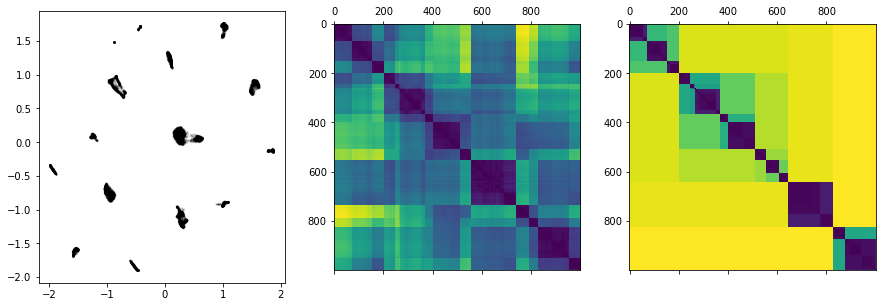

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird0.pickle (7652, 2)


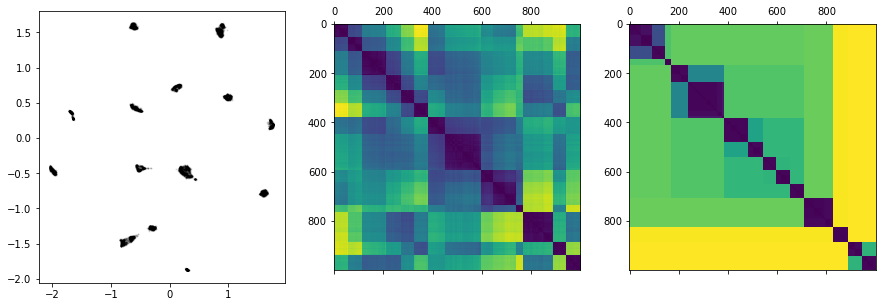

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird8.pickle (4985, 2)


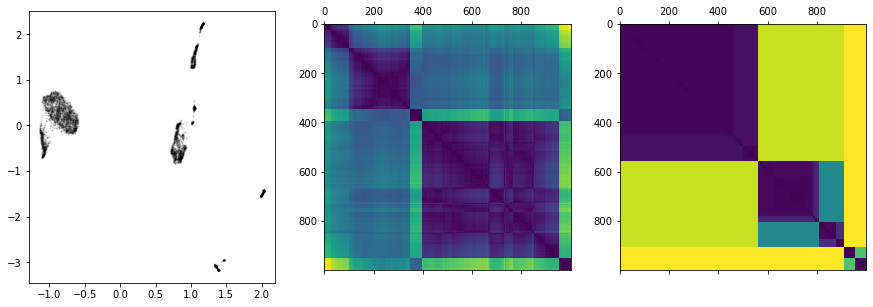

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird2.pickle (26127, 2)


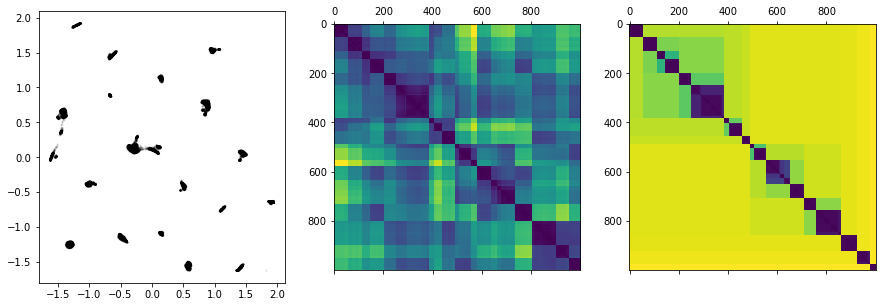

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird7.pickle (20722, 2)


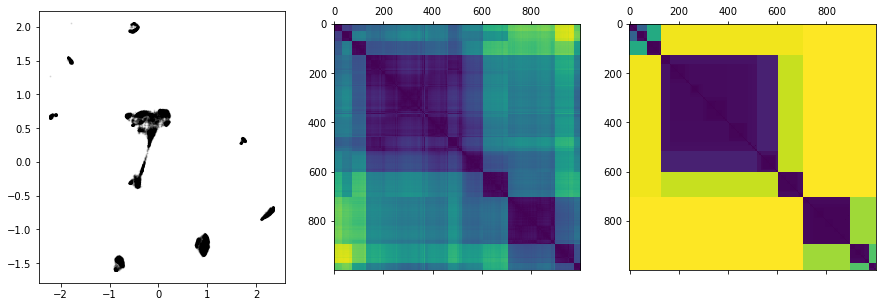

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM34.pickle (3039, 2)


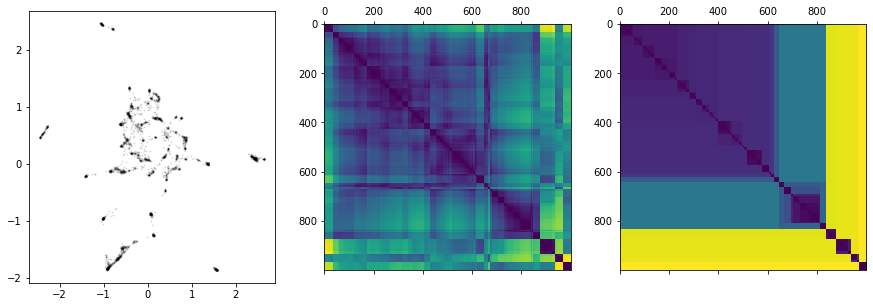

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM14.pickle (1533, 2)


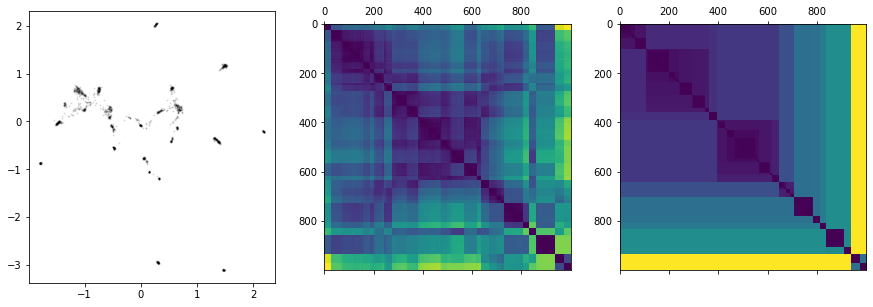

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM31.pickle (3468, 2)


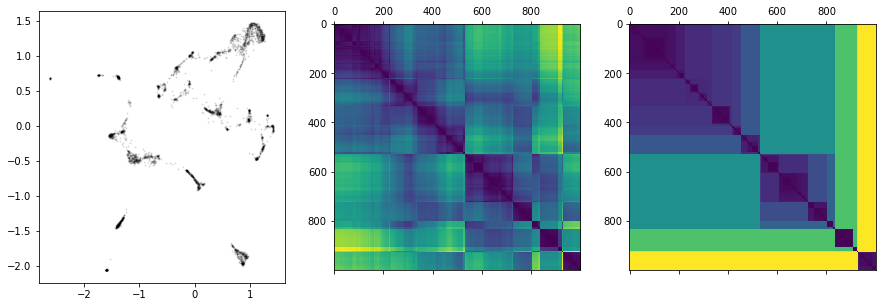

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM37.pickle (2214, 2)


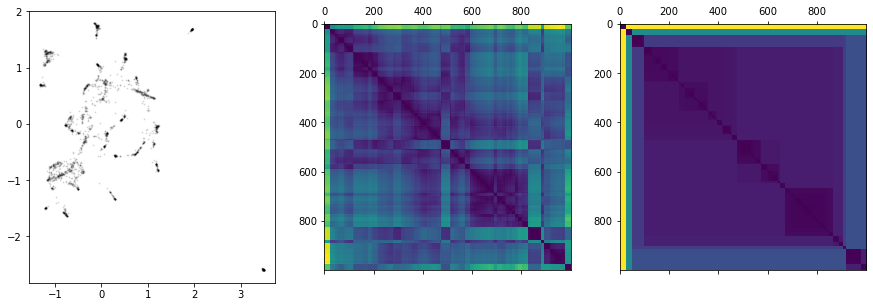

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM16.pickle (2515, 2)


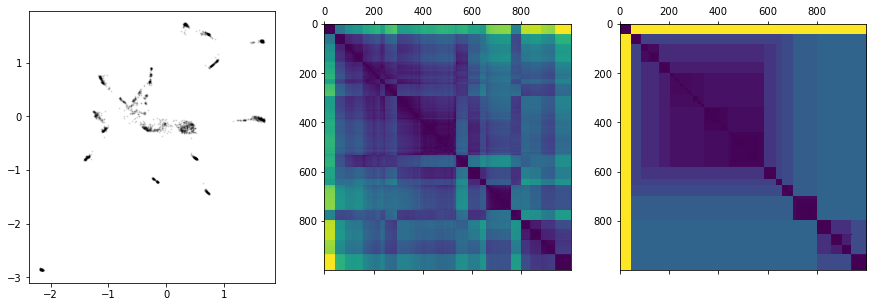

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM25.pickle (598, 2)


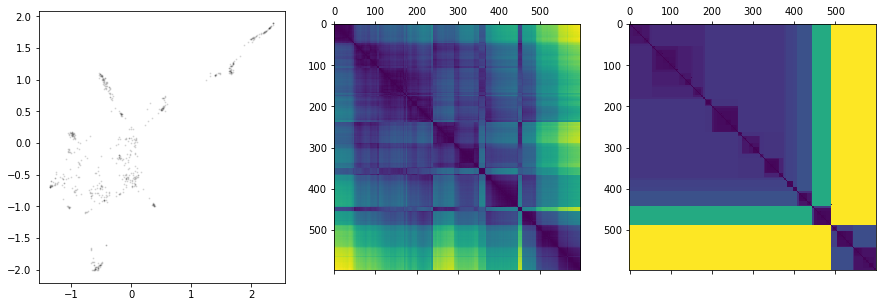

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM19.pickle (1285, 2)


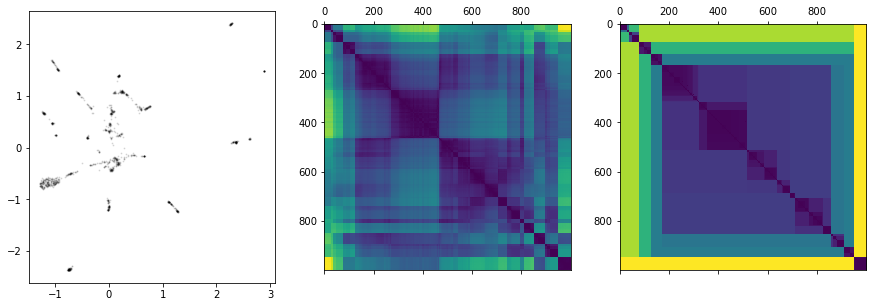

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM03.pickle (2446, 2)


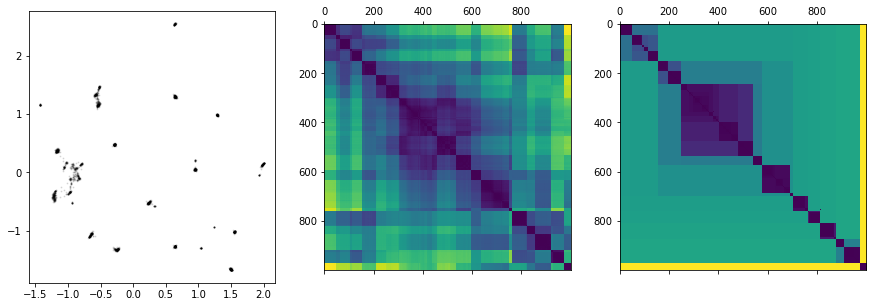

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM04.pickle (2346, 2)


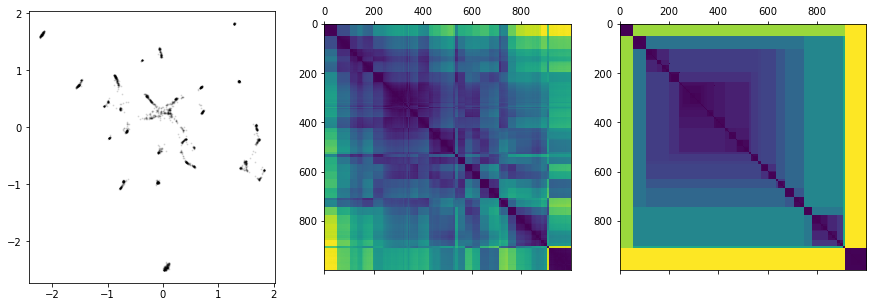

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM09.pickle (1306, 2)


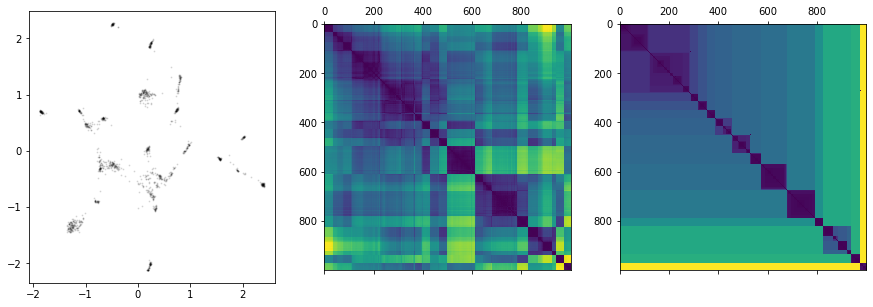

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM13.pickle (1538, 2)


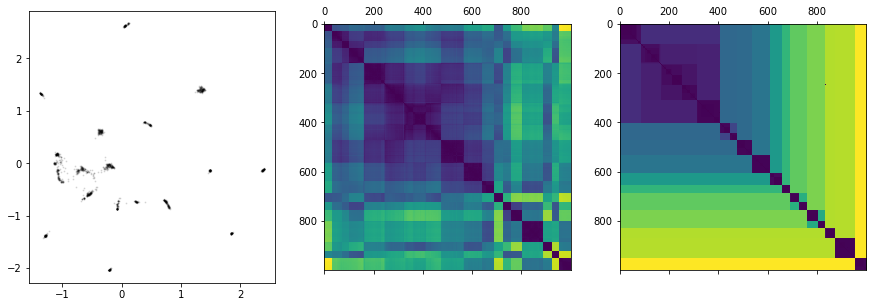

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM21.pickle (2542, 2)


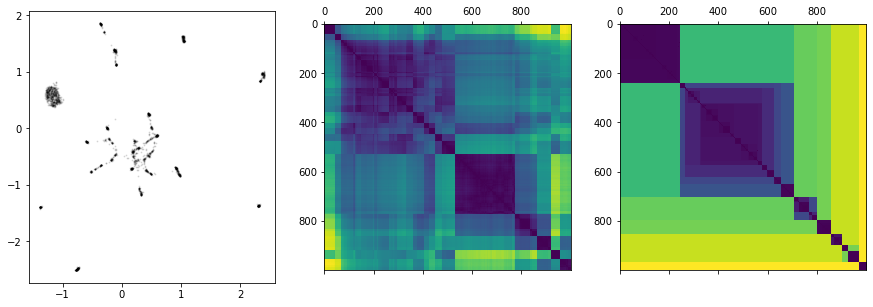

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM27.pickle (3734, 2)


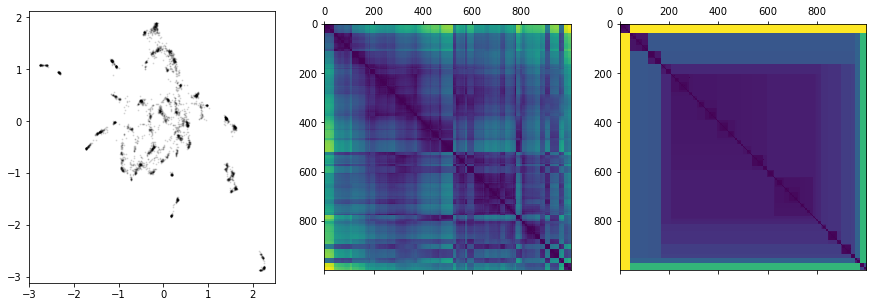

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM40.pickle (9190, 2)


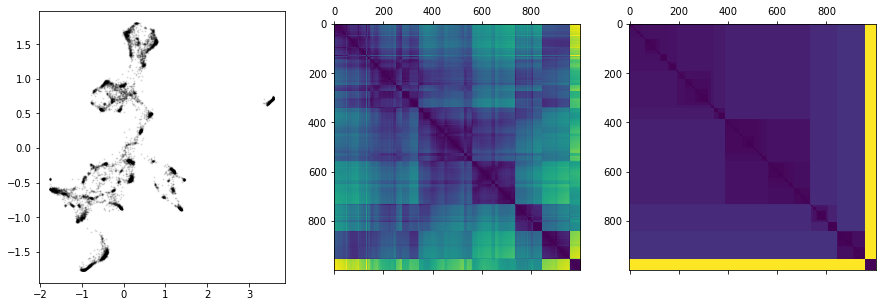

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM33.pickle (3308, 2)


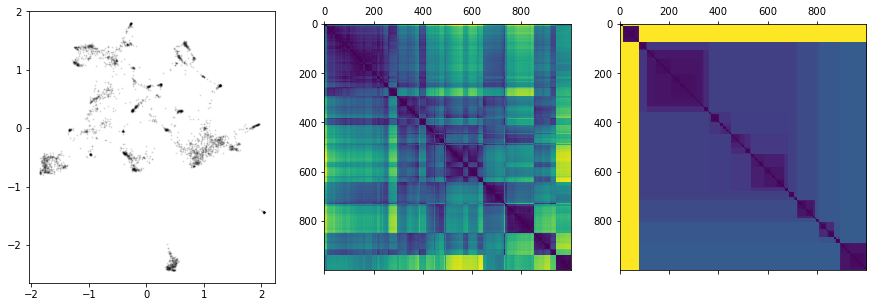

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM35.pickle (2290, 2)


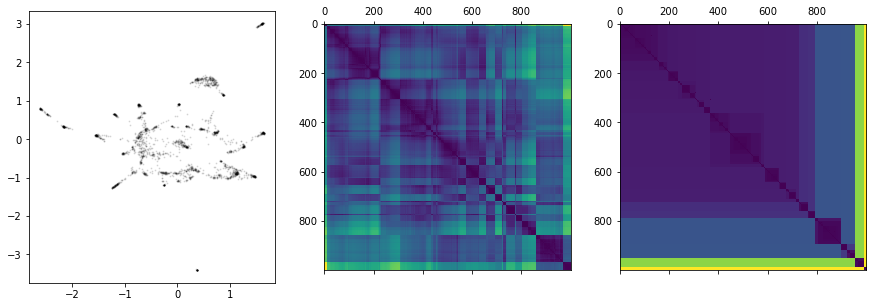

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM05.pickle (2062, 2)


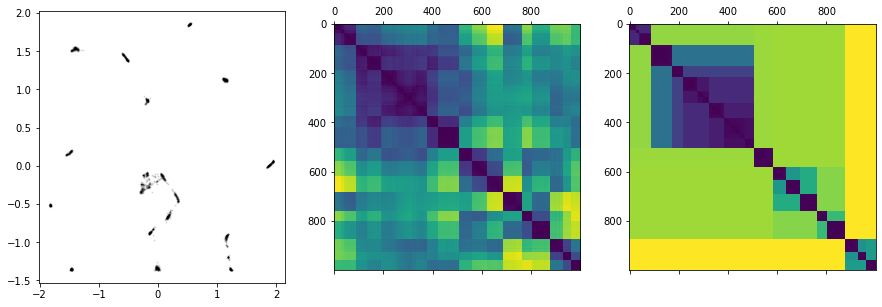

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM44.pickle (2889, 2)


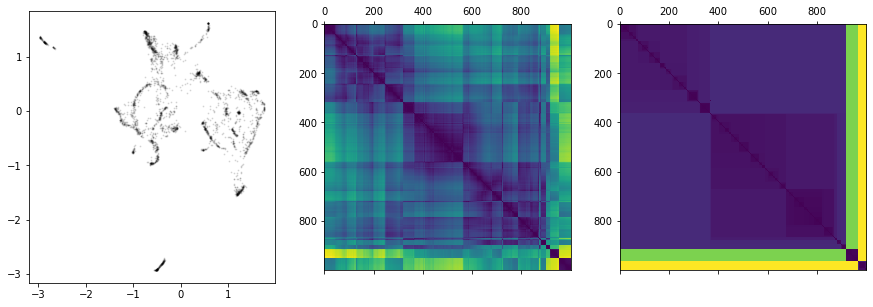

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM11.pickle (2664, 2)


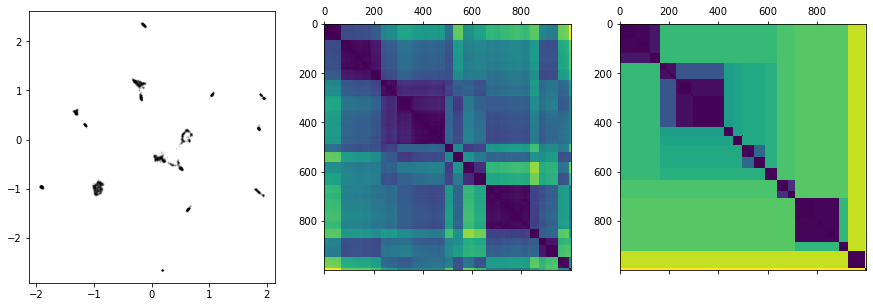

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM02.pickle (1966, 2)


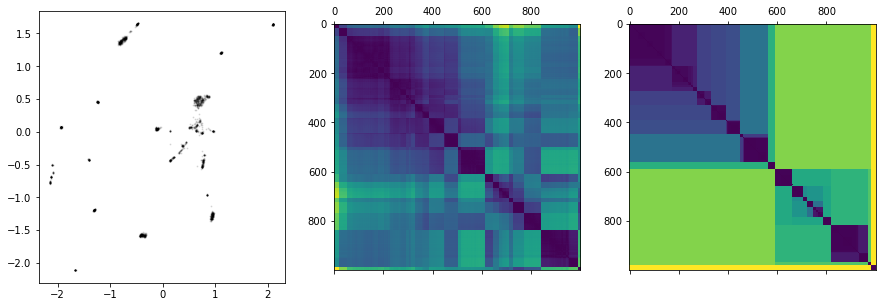

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM41.pickle (2073, 2)


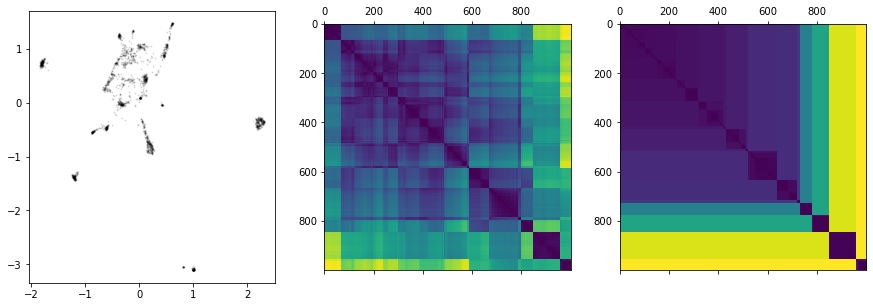

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM08.pickle (2224, 2)


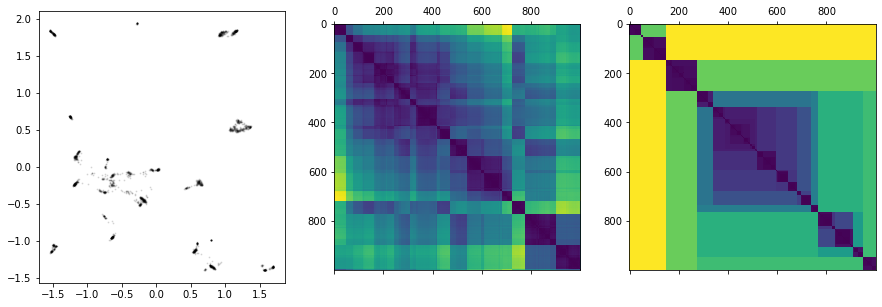

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM17.pickle (1674, 2)


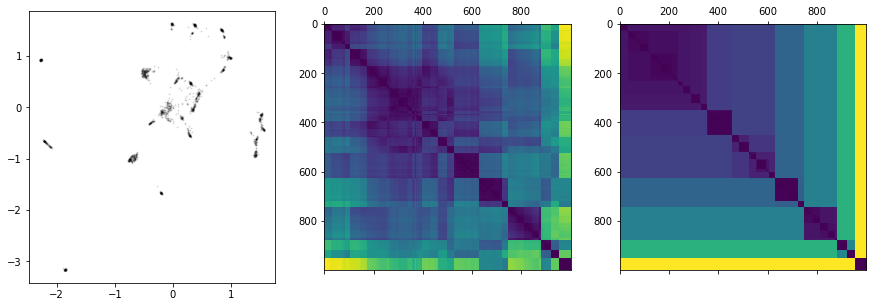

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM39.pickle (4580, 2)


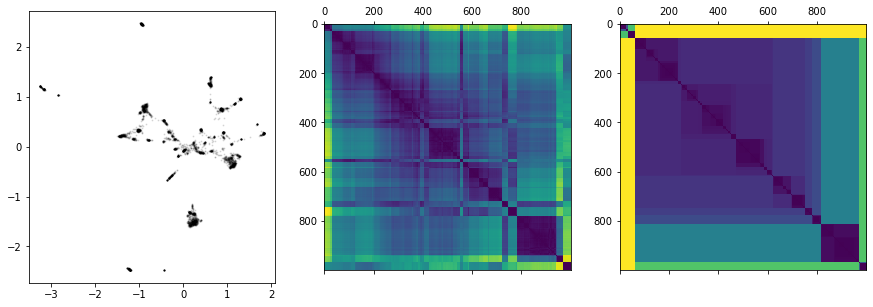

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM38.pickle (5647, 2)


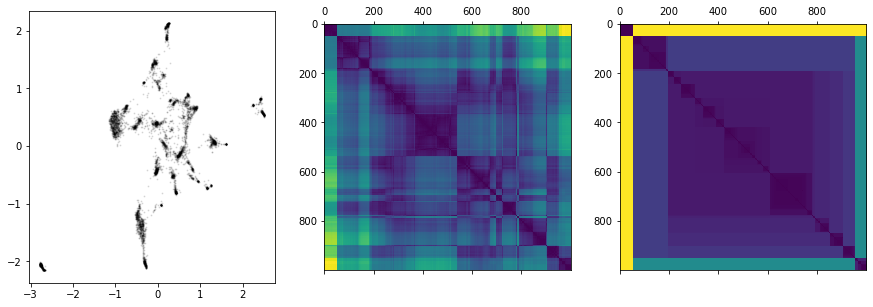

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM42.pickle (2393, 2)


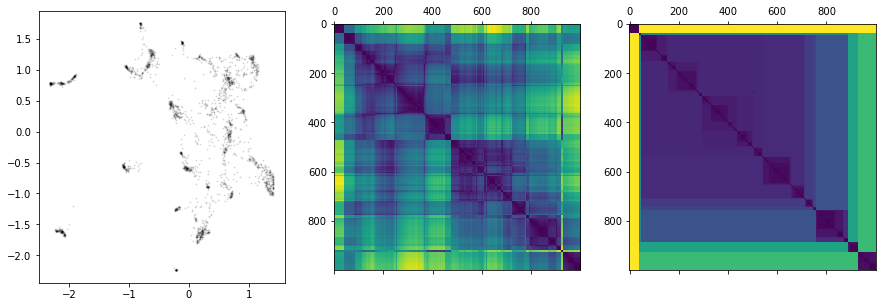

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM18.pickle (1353, 2)


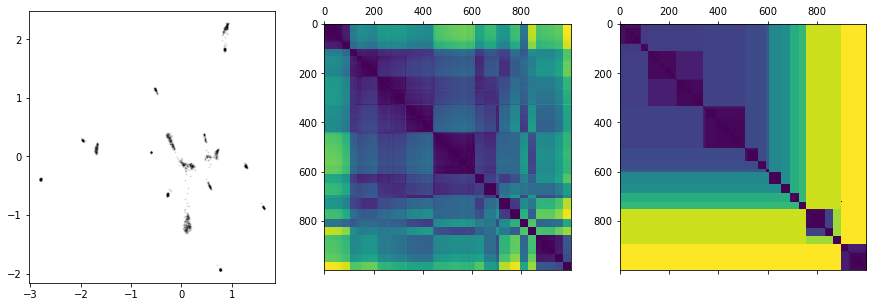

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM12.pickle (1799, 2)


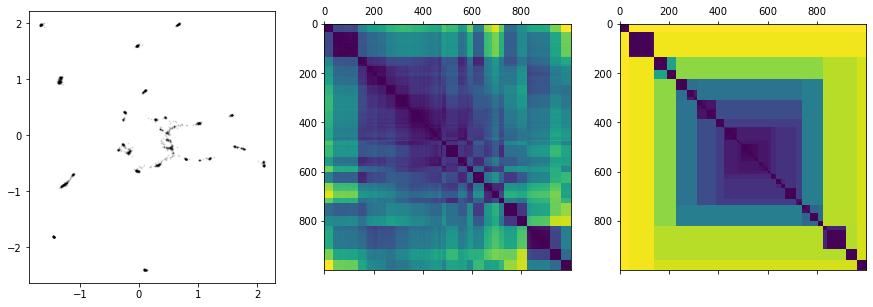

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM26.pickle (3551, 2)


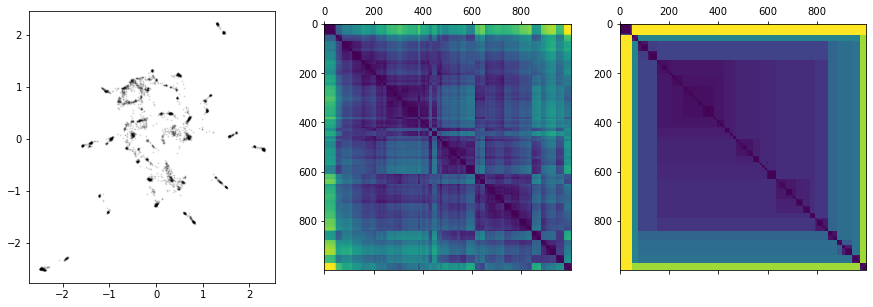

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM24.pickle (147, 2)


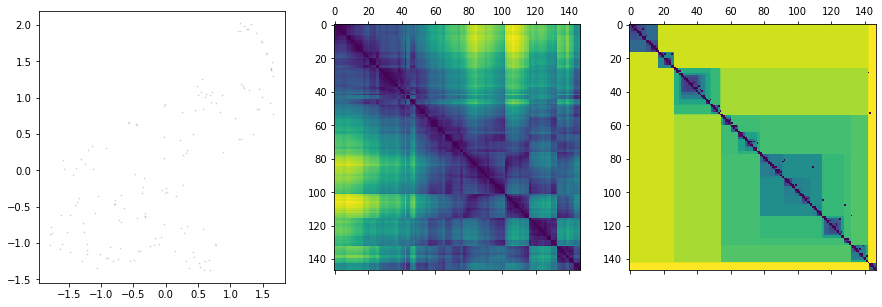

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM06.pickle (1669, 2)


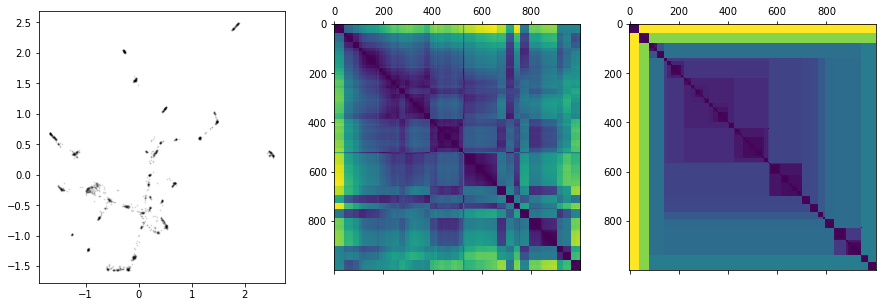

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM07.pickle (1898, 2)


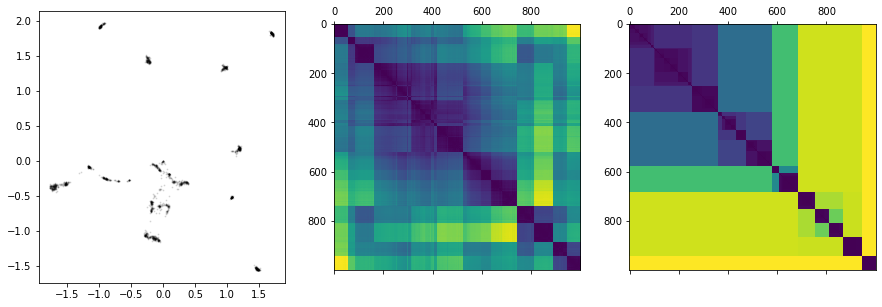

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM30.pickle (2077, 2)


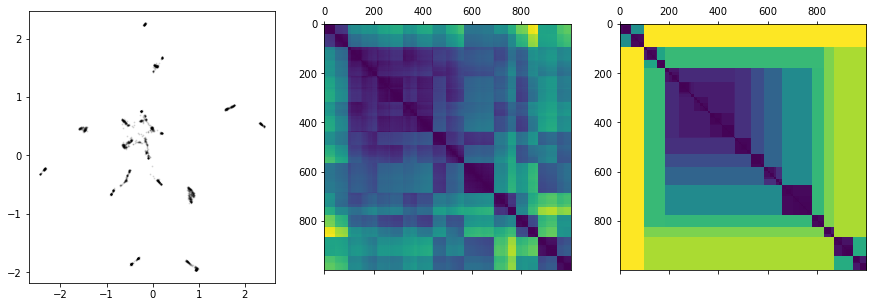

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM15.pickle (2234, 2)


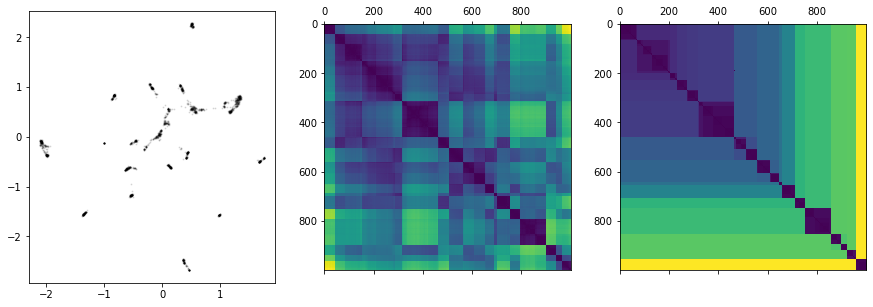

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM01.pickle (2389, 2)


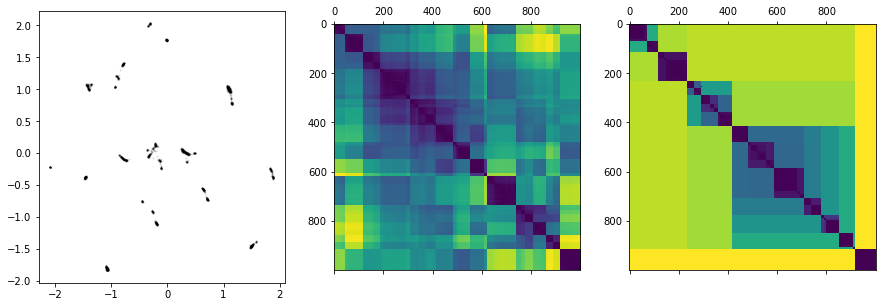

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM36.pickle (5117, 2)


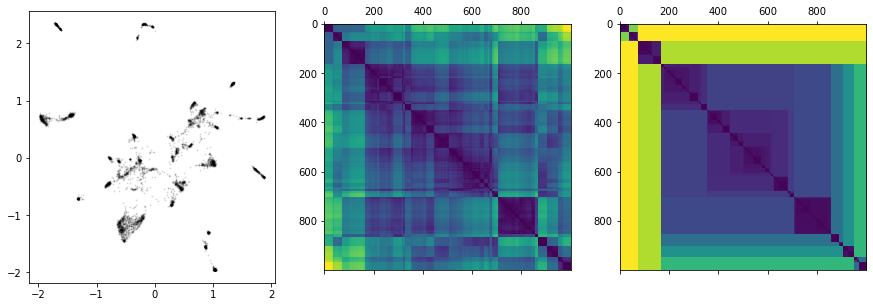

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM20.pickle (1712, 2)


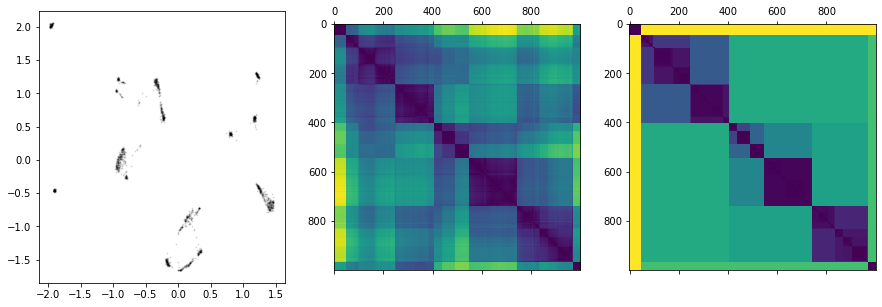

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM28.pickle (1902, 2)


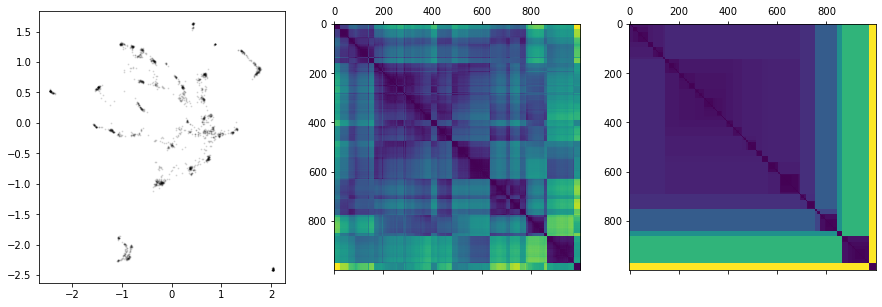

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM32.pickle (4946, 2)


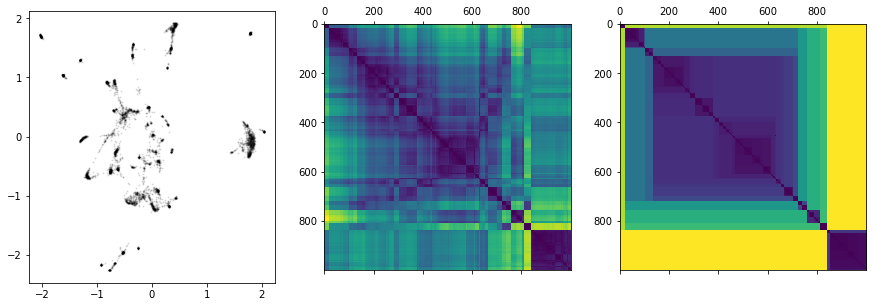

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM23.pickle (1663, 2)


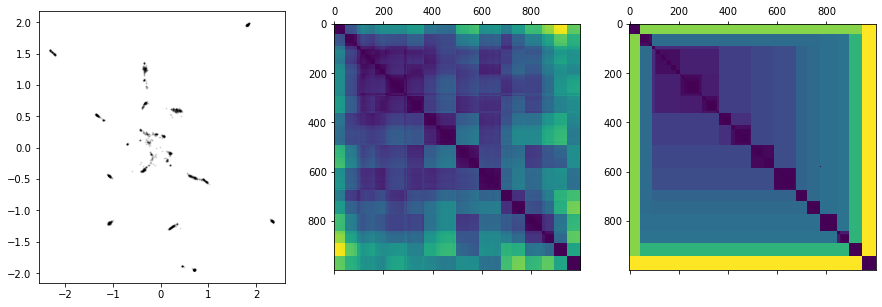

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM29.pickle (3160, 2)


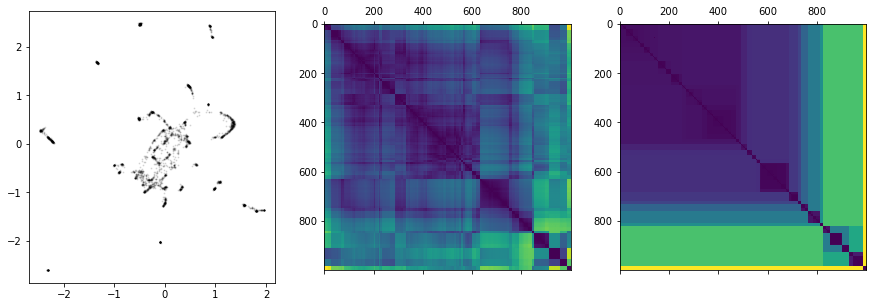

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM22.pickle (790, 2)


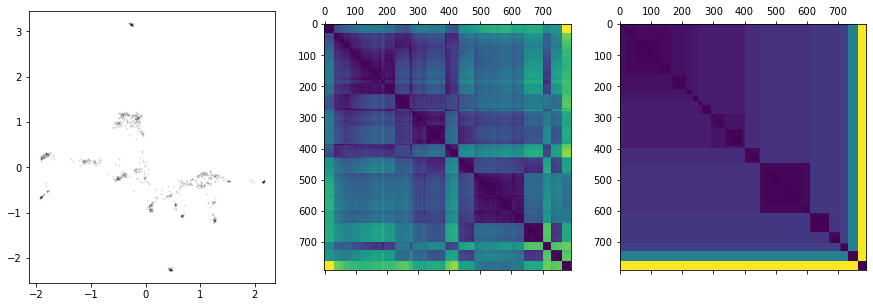

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM10.pickle (2068, 2)


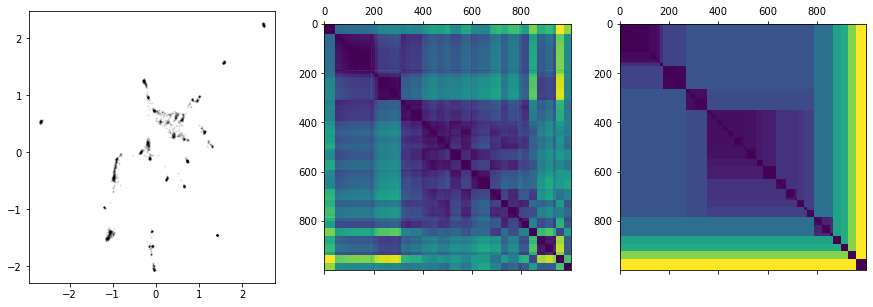

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM43.pickle (1501, 2)


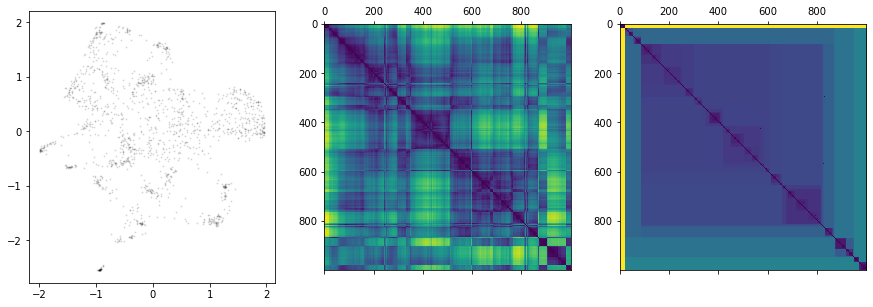

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr28.pickle (12067, 2)


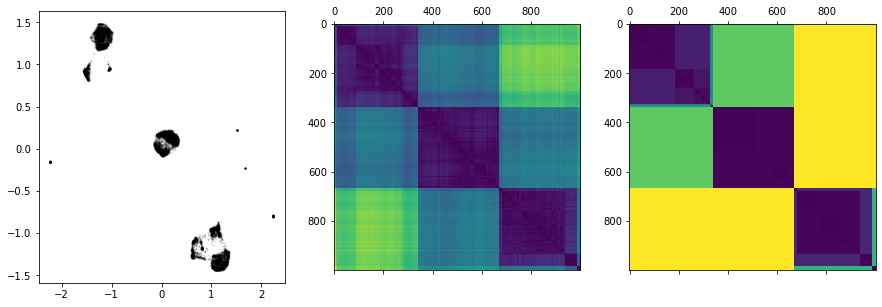

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lny42.pickle (12959, 2)


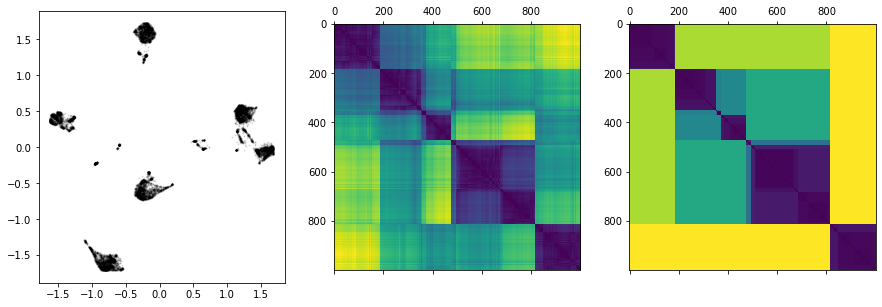

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lny64.pickle (8449, 2)


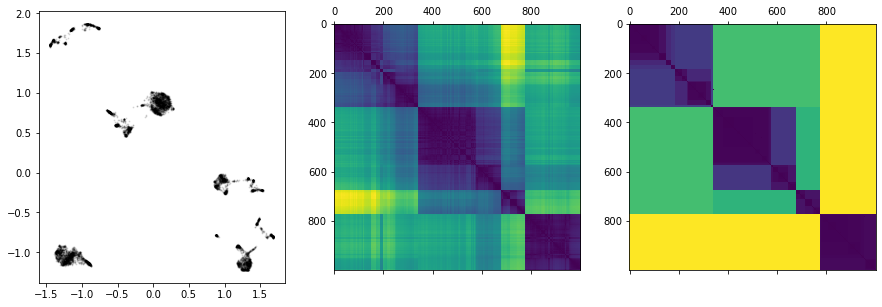

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr77.pickle (11931, 2)


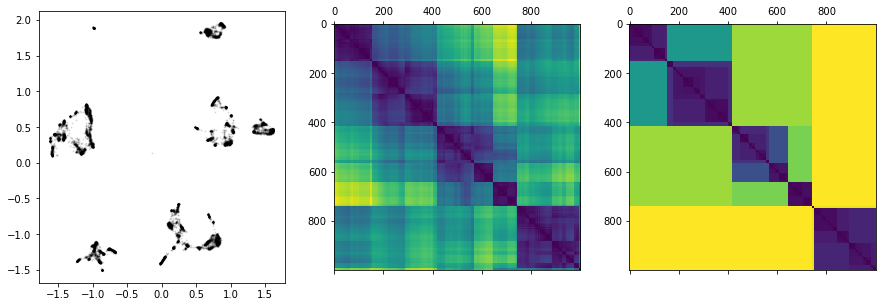

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr13.pickle (9118, 2)


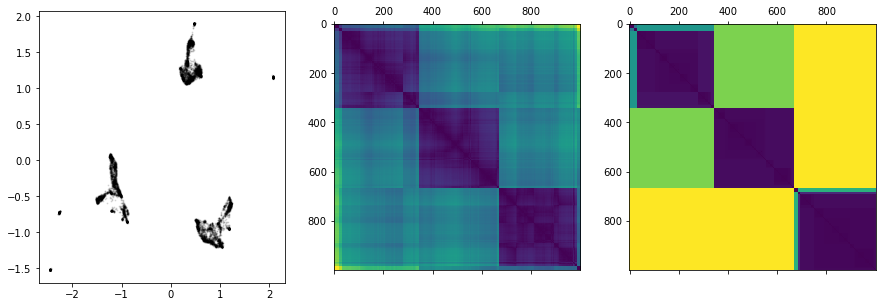

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr12.pickle (11369, 2)


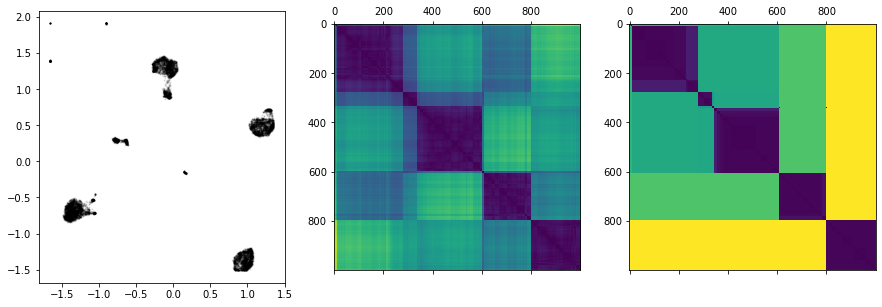

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/giant_otter/full.pickle (453, 2)


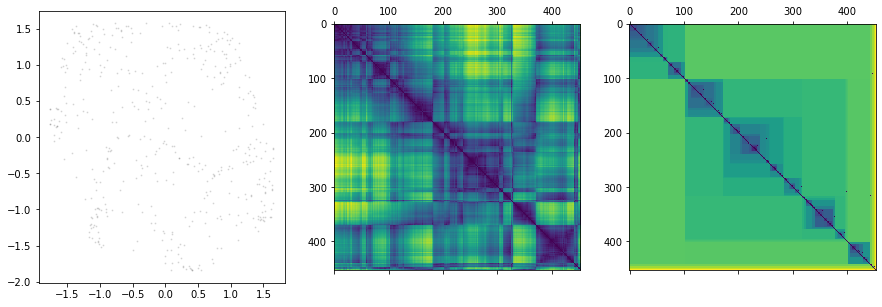

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1076.pickle (25406, 2)


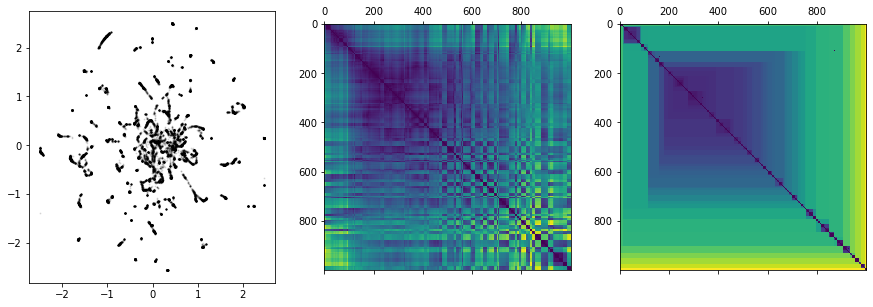

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1053.pickle (24110, 2)


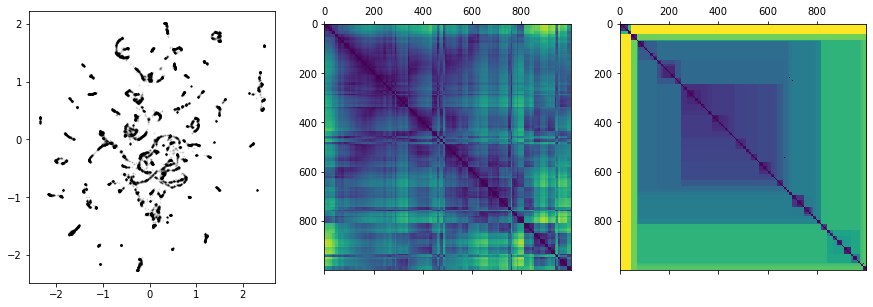

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1060.pickle (65871, 2)


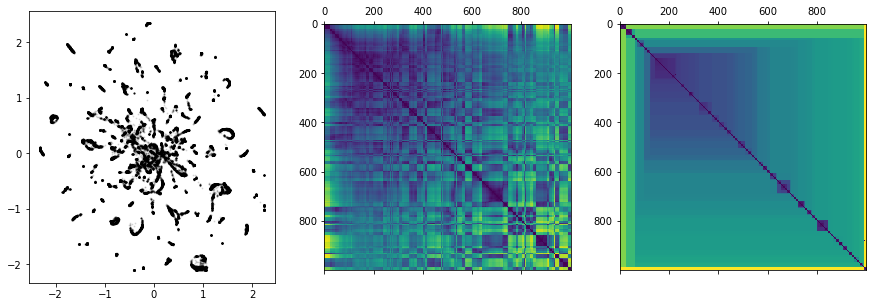

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1125.pickle (2702, 2)


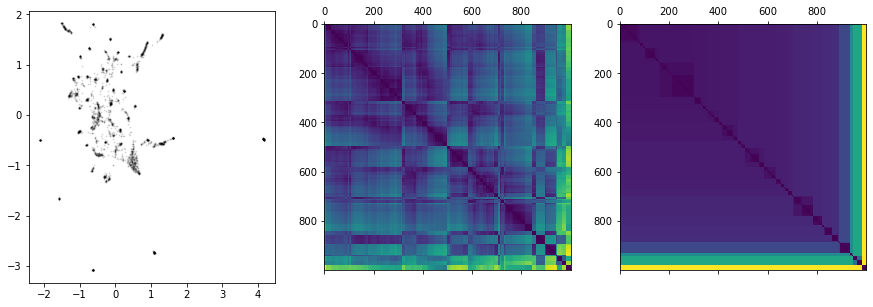

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1143.pickle (5316, 2)


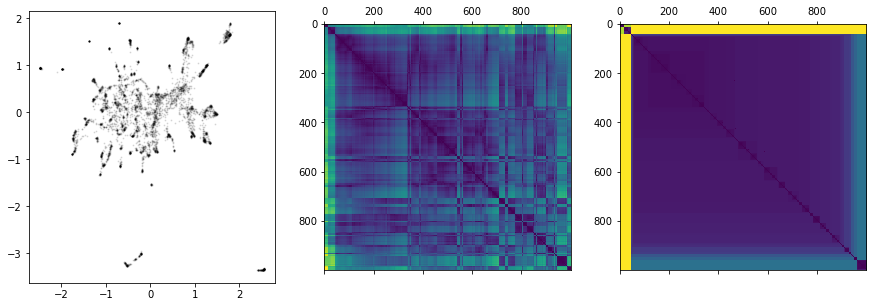

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1077.pickle (18570, 2)


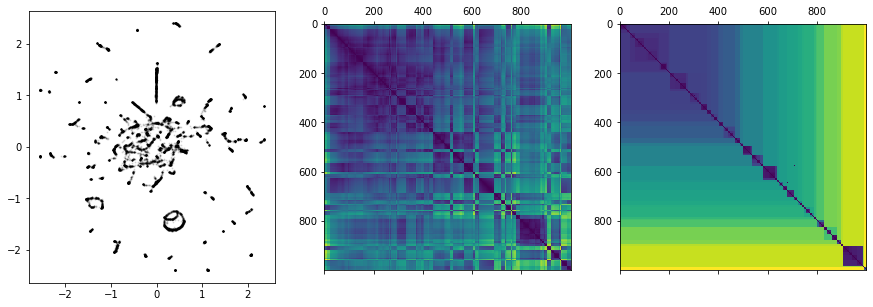

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1066.pickle (22259, 2)


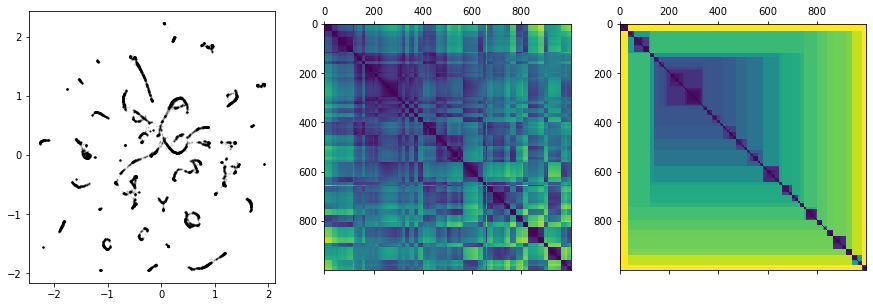

In [13]:
nex_max = 1000
clusterability_df = pd.DataFrame(columns=[
    'df', 'dataset', 'indv', 'sampled_indices', 'VAT', 'iVAT', 'order'
])
for dataset in tqdm(datasets):
    umap_proj = np.vstack(pd.read_pickle(dataset)[['umap']].umap.values)
    umap_proj = remove_outliers(umap_proj, pct=99.5)
    umap_proj = scale(umap_proj)
    print(dataset, np.shape(umap_proj))
    if len(umap_proj) <= nex_max:
        samples = np.arange(len(umap_proj))
    else:
        samples = np.random.choice(np.arange(len(umap_proj)), nex_max)
    VAT, order = ordered_dissimilarity_matrix(umap_proj[samples])
    iVAT = ivat_ordered_dissimilarity_matrix(VAT)
    
    fig, axs = plt.subplots(ncols = 3, figsize=(15,5))
    axs[0].scatter(umap_proj[:, 0], umap_proj[:, 1], s=1, color='k', alpha=0.1)
    axs[1].matshow(VAT)
    axs[2].matshow(iVAT)
    plt.show()

    clusterability_df.loc[len(clusterability_df)] = [
        dataset, dataset.parent.stem, dataset.stem, samples, VAT, iVAT, order
    ]

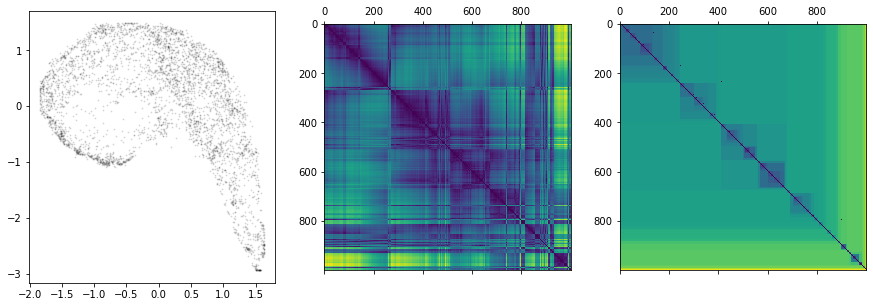

In [11]:
fig, axs = plt.subplots(ncols = 3, figsize=(15,5))
axs[0].scatter(umap_proj[:, 0], umap_proj[:, 1], s=1, color='k', alpha=0.1)
axs[1].matshow(VAT)
axs[2].matshow(iVAT)
plt.show()

In [37]:
np.shape(umap_proj)

(22259, 2)

In [14]:
clusterability_df[:3]

,df,dataset,indv,hopkins_10,hopkins_100,hopkins_pct_0.1,hopkins_pct_1,hopkins_pct_5,hopkins_pct_10,hopkins_statistic
0,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC592,0.039492,0.067833,0.108415,0.041162,0.066083,0.053885,0.949342
1,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC591,0.033862,0.023253,0.015418,0.031276,0.034472,0.030001,0.971114
2,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC597,0.079909,0.053442,0.015008,0.063217,0.054078,0.059393,0.942709


In [15]:
clusterability_df.dataset.unique()

array(['castellucci_mouse_usv_segmented', 'BIRD_DB_Vireo_cassinii',
       'gibbon_morita_segmented', 'bengalese_finch_sober',
       'BIRD_DB_Toxostoma_redivivum', 'buckeye', 'swamp_sparrow',
       'mobysound_humpback_whale', 'koumura_bengalese_finch',
       'katahira_white_munia_segmented', 'zebra_finch_gardner_segmented',
       'giant_otter', 'european_starling_gentner_segmented'], dtype=object)

In [16]:
species_dict = {
    'castellucci_mouse_usv_segmented': {
        'species': 'Mouse',
        'group': 'mammal'
    },
    'BIRD_DB_Vireo_cassinii': {
        'species': 'Cassin\'s vireo',
        'group': 'songbird'
    },
    'gibbon_morita_segmented': {
        'species': 'Gibbon',
        'group': 'mammal'
    },
    'bengalese_finch_sober': {
        'species': 'Bengalese finch',
        'group': 'songbird'
    },
    'buckeye': {
        'species': 'Human (English)',
        'group': 'mammal'
    },
    'swamp_sparrow': {
        'species': 'Swamp sparrow',
        'group': 'songbird'
    },
    'mobysound_humpback_whale': {
        'species': 'Humpback whale',
        'group': 'mammal'
    },
    'koumura_bengalese_finch': {
        'species': 'Bengalese finch',
        'group': 'songbird'
    },
    'giant_otter': {
        'species': 'Giant otter',
        'group': 'mammal'
    },
    'BIRD_DB_Toxostoma_redivivum': {
        'species': 'California thrasher',
        'group': 'songbird'
    },
    'zebra_finch_gardner_segmented': {
        'species': 'Zebra finch',
        'group': 'songbird'
    },
    'katahira_white_munia_segmented': {
        'species': 'White-rumped munia',
        'group': 'songbird'
    },
    'european_starling_gentner_segmented': {
        'species': 'European starling',
        'group': 'songbird'
    },
}

In [17]:
clusterability_df['species'] = [species_dict[ds]['species']  for ds in clusterability_df['dataset'].values]
clusterability_df['family'] = [species_dict[ds]['group']  for ds in clusterability_df['dataset'].values]

In [18]:
import seaborn as sns

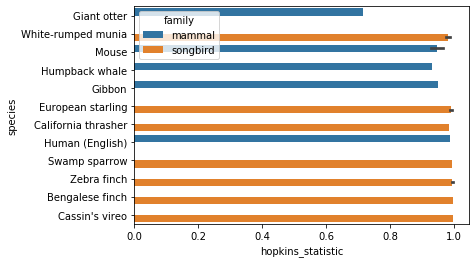

In [20]:
metric = 'hopkins_statistic'
sns.barplot(x=metric,
            y="species",
            hue='family',
            data=clusterability_df.sort_values(by=metric),
            )